In [1]:
import scanpy
import treeclust.scanpy as tcsc

from treeclust.pipelines import PipelineBootstrapper
from treeclust.decomposition import PCA
from sklearn.model_selection import ShuffleSplit

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from distinctipy import distinctipy

import moscot

/Users/gatocor/miniforge3/envs/treeclust-scanpy/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
files = (
    "48h",
    "72h",
    "96h",
    "120h", 
    "144h",
)

In [3]:
adata_full = scanpy.read_h5ad(f"data/dias_full_EM_processed_annotated.h5ad")
adata_full.obs["annotation_hard"] = ""

for file in files:

    adata1 = scanpy.read_h5ad(f"data/dias_{file}_EM_processed_annotated_plotting.h5ad")

    cell_id = adata1.obs.Cell

    adata_full.obs.loc[adata_full.obs["time"].values==file,"annotation_hard"] = adata1.obs.loc[:,"annotation_hard"]

/Users/gatocor/miniforge3/envs/treeclust-scanpy/lib/python3.13/site-packages/anndata/_core/anndata.py:1796: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [4]:
adata_full.obs["annotation_hard"].nunique()

28

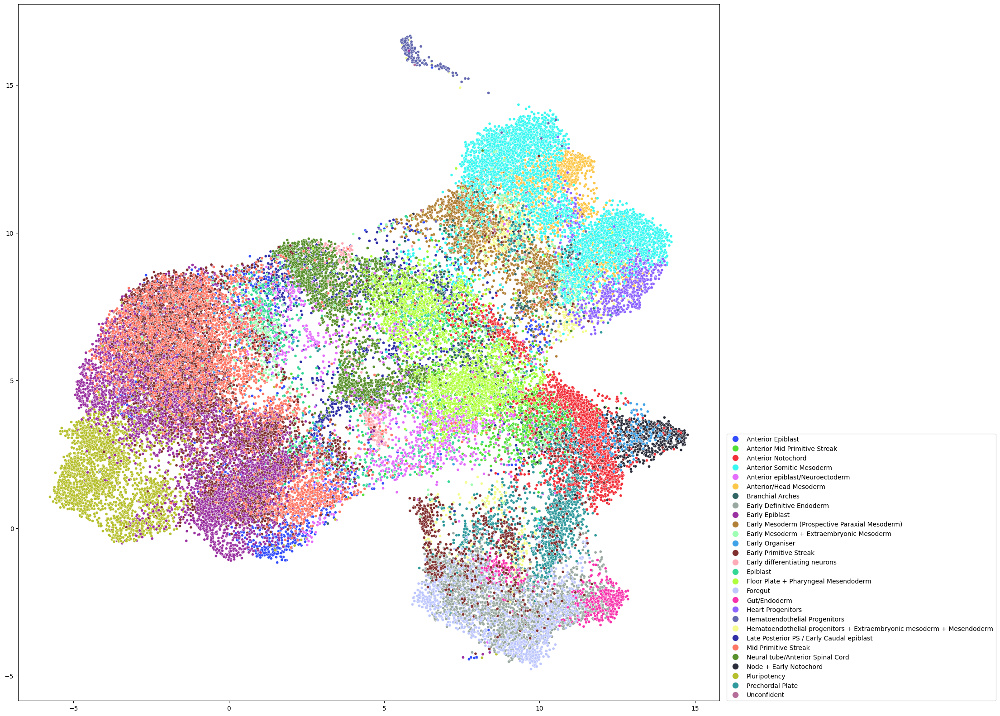

In [5]:
label = "annotation_hard"

fig, ax = plt.subplots(figsize=(20,20))

np.random.seed(0)

sns.scatterplot(
    x=adata_full.obsm["X_umap_pca_harmony"][:,0],
    y=adata_full.obsm["X_umap_pca_harmony"][:,1],
    hue=adata_full.obs[label],
    hue_order=np.sort(adata_full.obs[label].unique()),
    palette=distinctipy.get_colors(adata_full.obs[label].nunique(), pastel_factor=0.2, rng=0),
    s=20
)

# Get the legend and increase marker size
legend = ax.legend(loc=(1.01,0))
for handle in legend.legend_handles:
    handle.set_markersize(10)  # Use set_markersize for Line2D objects

fig.savefig("figures/full_scatterplot.svg", dpi=300, bbox_inches="tight")

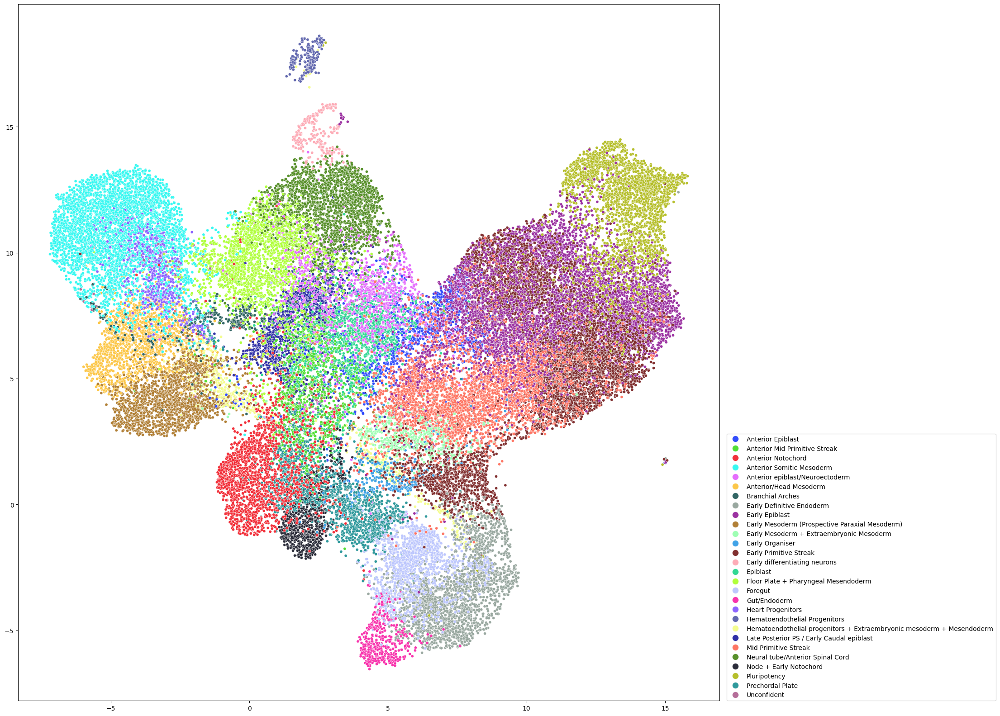

In [ ]:
label = "annotation_hard"

fig, ax = plt.subplots(figsize=(20,20))

np.random.seed(0)

sns.scatterplot(
    x=adata_full.obsm["X_umap_scvi"][:,0],
    y=adata_full.obsm["X_umap_scvi"][:,1],
    hue=adata_full.obs[label],
    hue_order=np.sort(adata_full.obs[label].unique()),
    palette=distinctipy.get_colors(adata_full.obs[label].nunique(), pastel_factor=0.2, rng=0),
    s=20
)

# Get the legend and increase marker size
legend = ax.legend(loc=(1.01,0))
for handle in legend.legend_handles:
    handle.set_markersize(10)  # Use set_markersize for Line2D objects

fig.savefig(f"figures/full_scatterplot_scvi_{label}.svg", dpi=300, bbox_inches="tight")

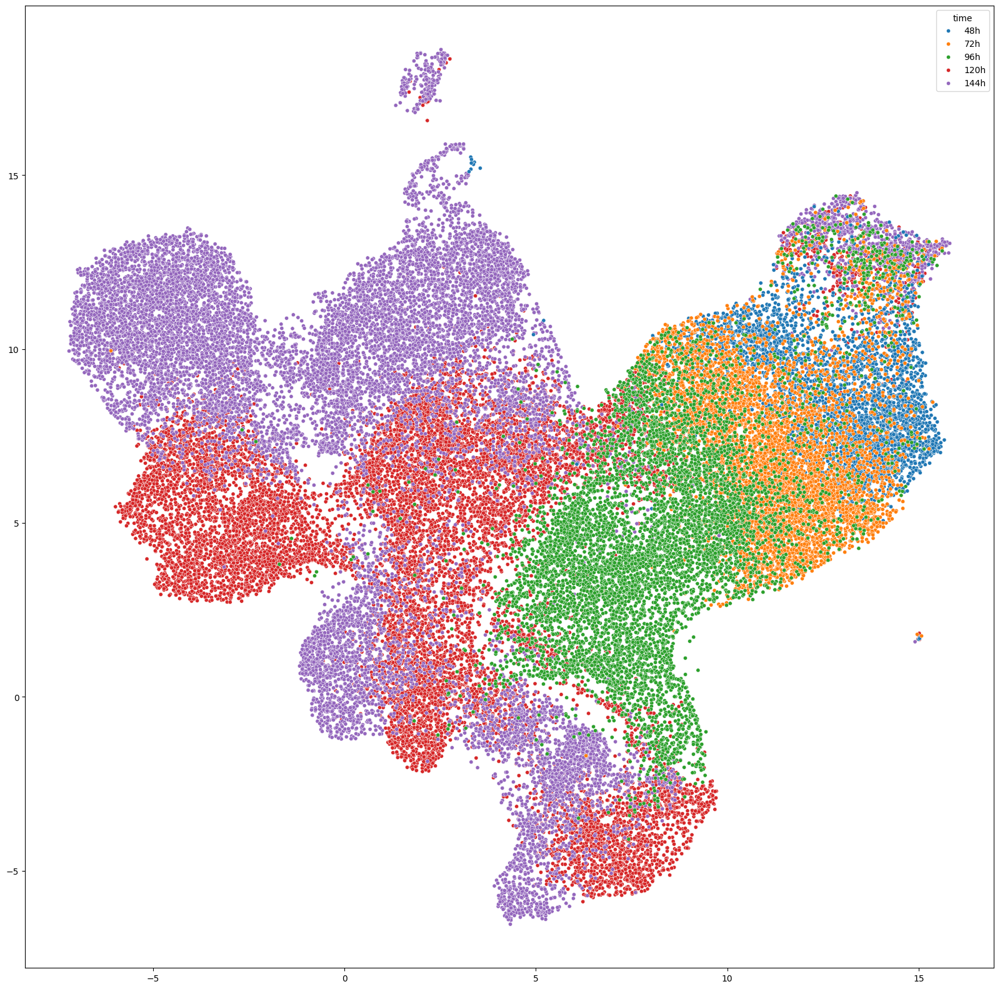

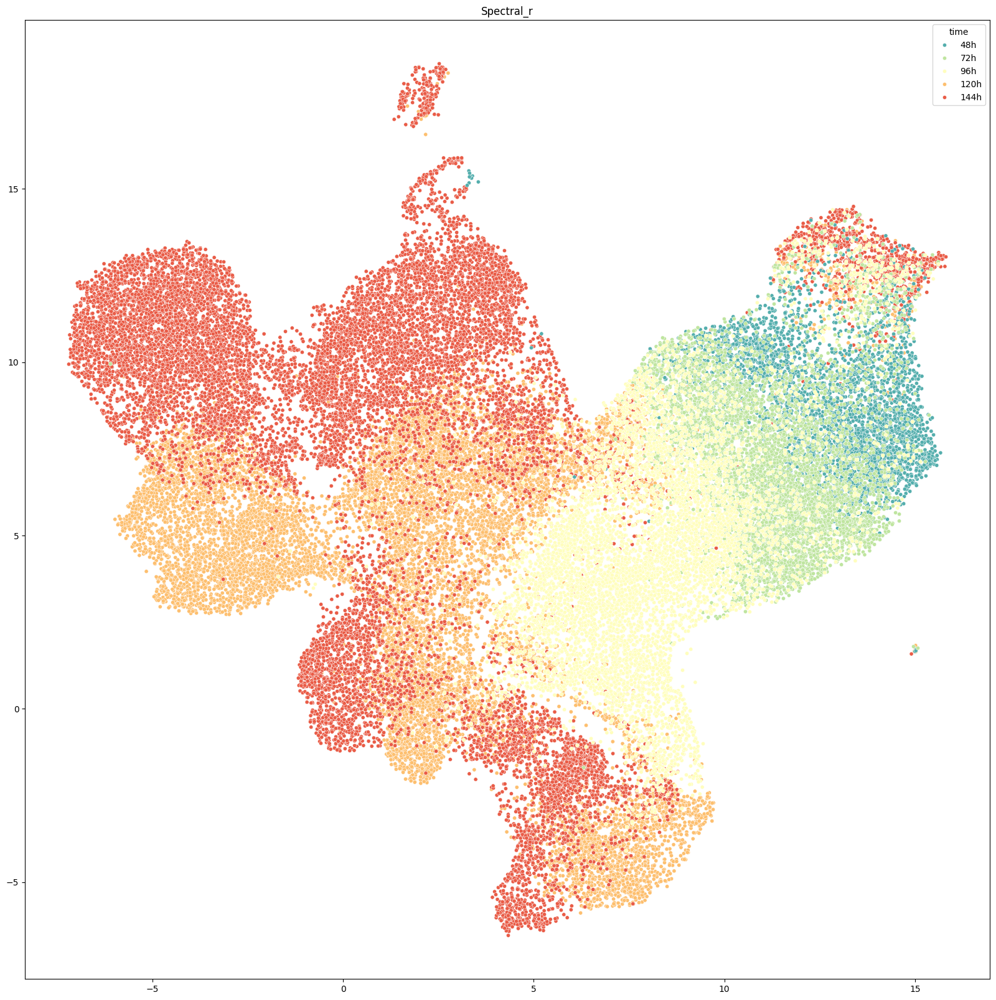

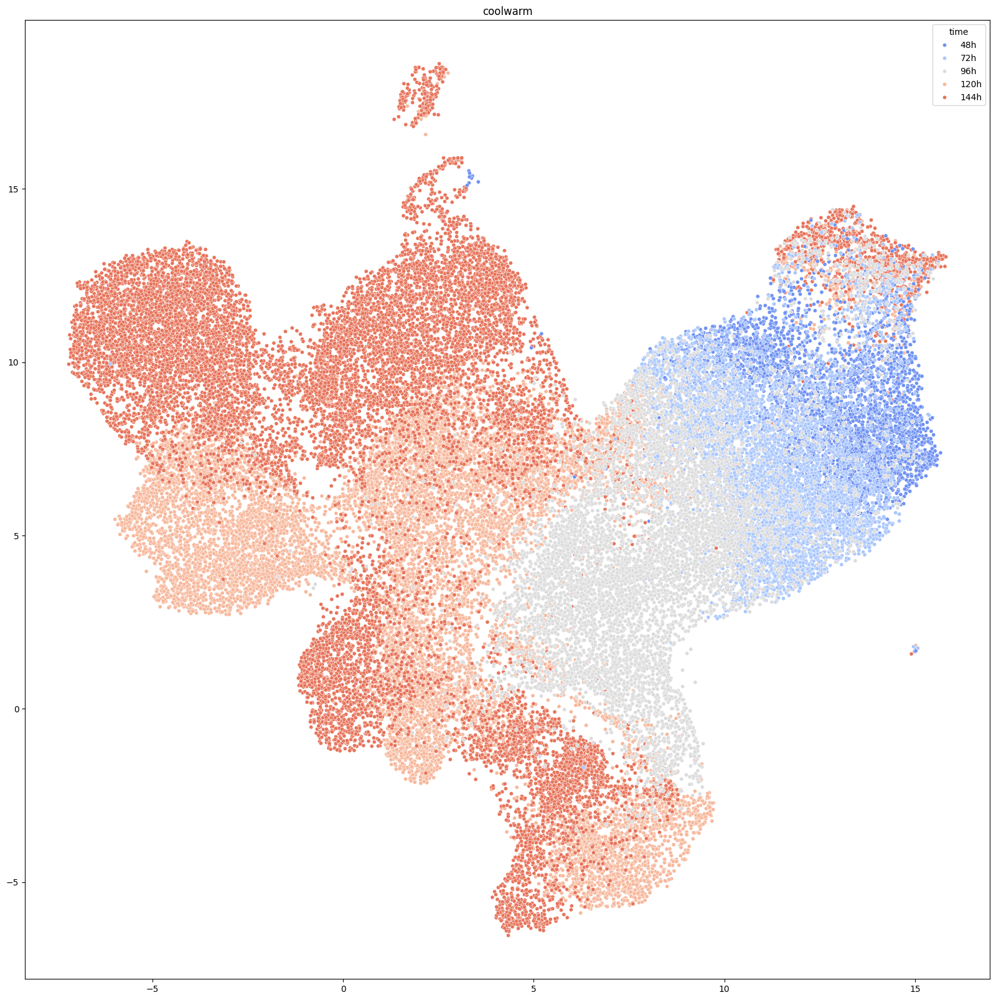

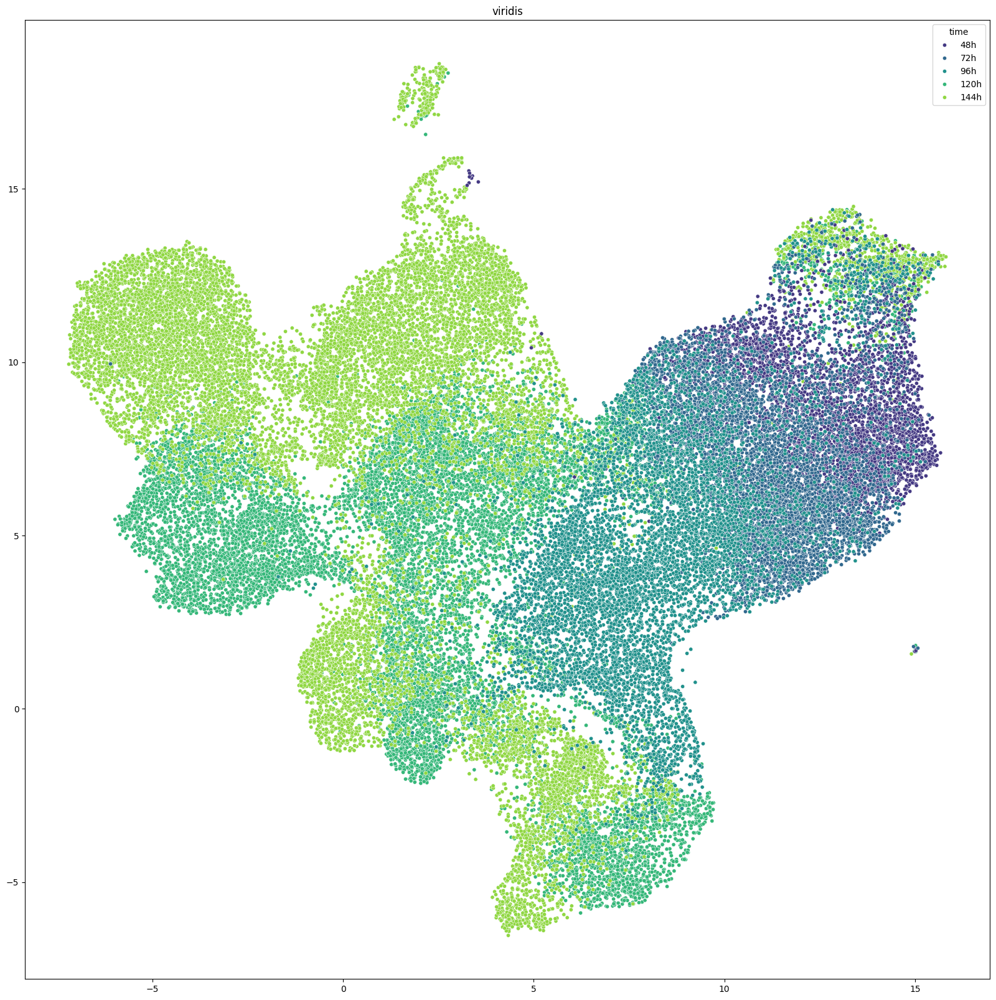

In [31]:
label = "time"

for cmap in [None,"Spectral_r","coolwarm","viridis"]:
    fig, ax = plt.subplots(figsize=(20,20))

    np.random.seed(0)

    sns.scatterplot(
        x=adata_full.obsm["X_umap_scvi"][:,0],
        y=adata_full.obsm["X_umap_scvi"][:,1],
        hue=adata_full.obs[label],
        hue_order=["48h","72h","96h","120h","144h"],
        palette=cmap,
        s=20
    )
    plt.title(cmap)
    plt.show()
    
    # Get the legend and increase marker size
    legend = ax.legend(loc=(1.01,0))
    for handle in legend.legend_handles:
        handle.set_markersize(10)  # Use set_markersize for Line2D objects

    fig.savefig(f"figures/full_scatterplot_scvi_{label}_{cmap}.svg", dpi=300, bbox_inches="tight")

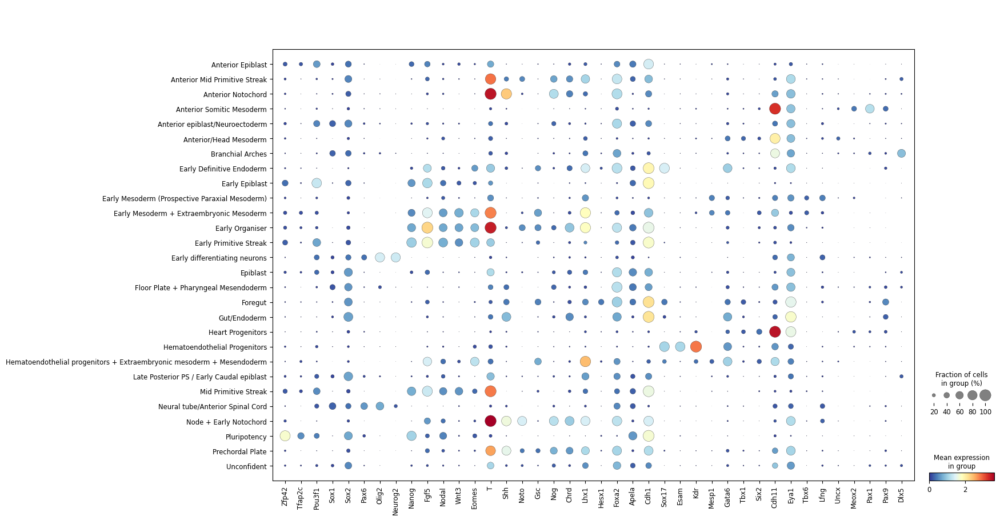

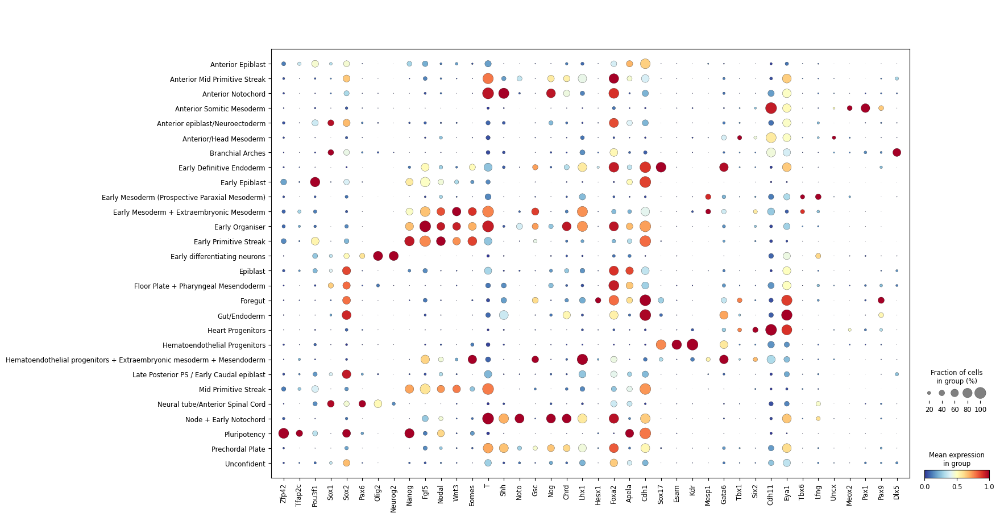

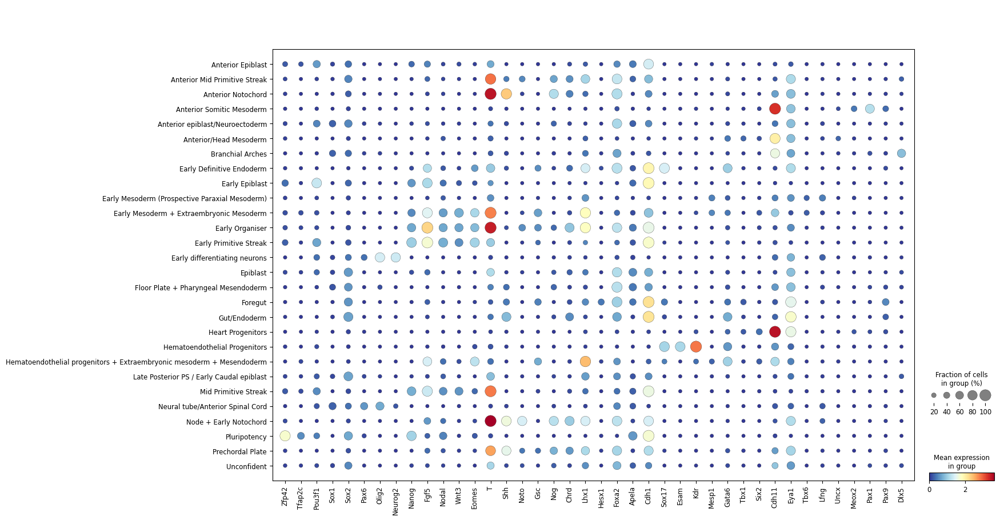

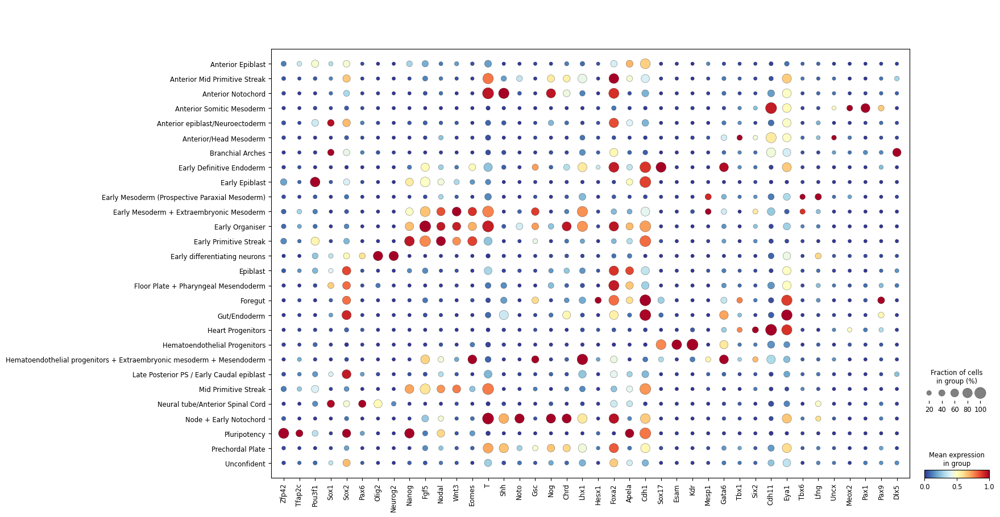

In [14]:
genes_path = f"markers/full-new3.csv"
genes = pd.read_csv(genes_path, header=None).values.flatten()

fig = scanpy.pl.dotplot(
    adata_full,
    var_names=genes,
    groupby="annotation_hard",
    cmap="RdYlBu_r",
    return_fig=True,
    #smallest_dot=20,
    )
fig.savefig(f"figures/full_dotplot_individual_annotation.svg", dpi=300)

fig = scanpy.pl.dotplot(
    adata_full,
    var_names=genes,
    groupby="annotation_hard",
    cmap="RdYlBu_r",
    return_fig=True,
    standard_scale = 'var',
    #smallest_dot=20,
    )
fig.savefig(f"figures/full_dotplot_scaled_individual_annotations.svg", dpi=300)

fig = scanpy.pl.dotplot(
    adata_full,
    var_names=genes,
    groupby="annotation_hard",
    cmap="RdYlBu_r",
    return_fig=True,
    smallest_dot=20,
    )
fig.savefig(f"figures/full_dotplot_individual_annotation_dots_rescaled.svg", dpi=300)

fig = scanpy.pl.dotplot(
    adata_full,
    var_names=genes,
    groupby="annotation_hard",
    cmap="RdYlBu_r",
    return_fig=True,
    standard_scale = 'var',
    smallest_dot=20,
    )
fig.savefig(f"figures/full_dotplot_scaled_individual_annotations_dots_rescaled.svg", dpi=300)

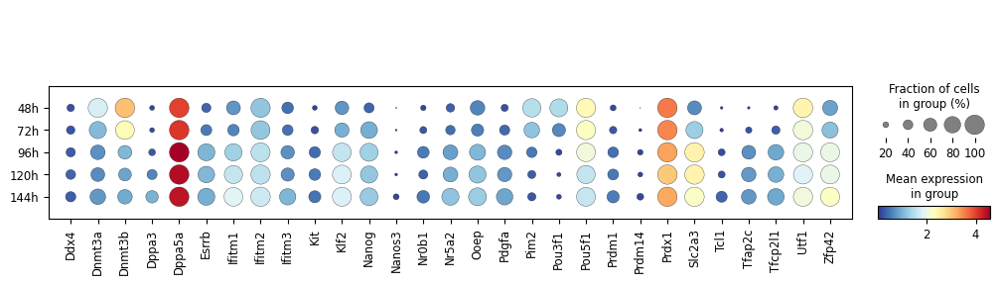

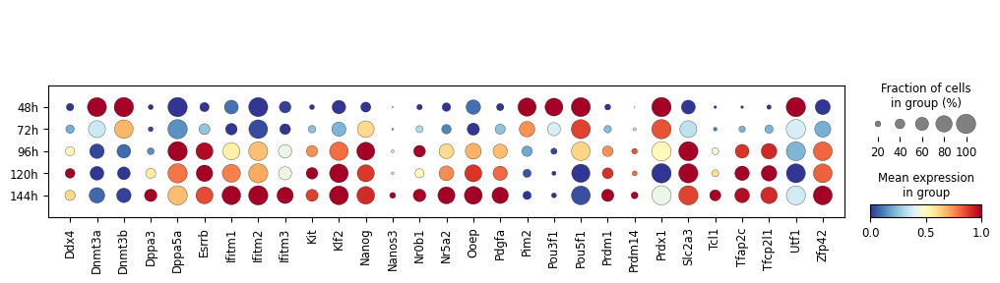

In [ ]:
genes_path = f"markers/pluripotency.csv"
genes = pd.read_csv(genes_path, header=None).values.flatten()

adata_full_ = adata_full[adata_full.obs["annotation_hard"] == "Pluripotency"]

fig = scanpy.pl.dotplot(
    adata_full_,
    var_names=genes,
    groupby="time",
    cmap="RdYlBu_r",
    return_fig=True,
    #smallest_dot=20,
    )
fig.savefig(f"figures/pluripotency_dotplot_time.svg", dpi=300)

fig = scanpy.pl.dotplot(
    adata_full_,
    var_names=genes,
    groupby="time",
    cmap="RdYlBu_r",
    return_fig=True,
    standard_scale = 'var',
    #smallest_dot=20,
    )
fig.savefig(f"figures/pluripotency_dotplot_scaled_time.svg", dpi=300)